<a href="https://colab.research.google.com/github/QOneK/Amazon-Delivery-Dataset-from-Kaggle/blob/main/Amazon_Delivery_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Amazon Delivery Dataset

---

Analyzing Last-Mile Logistics and Delivery Performance

Data on over 43,632 deliveries across multiple cities, with detailed information on order details, delivery agents, weather and traffic conditions, and delivery performance metrics.

Kaggle Notebook: https://www.kaggle.com/code/kyuhwankim/amazon-delivery-dataset

Github: https://github.com/QOneK/Amazon_Delivery_Kaggle/blob/main/Amazon_Delivery_Analysis_Kyuhwan_Kim.ipynb

Youtube explaining the dataset and analysis: https://www.youtube.com/watch?v=R59HEptM3UM&ab_channel=QOne

# Environment Setup

In [ ]:
#Import Packages
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# Load the dataset
data = pd.read_csv('/kaggle/input/amazon-delivery-dataset/amazon_delivery.csv')

# Data Overview

In [ ]:
#Obtain shape of dataset
data.shape

(43739, 16)

 There are 43,739 rows and 16 columns

In [ ]:
data.describe()

,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Delivery_Time
count,43739.000000,43685.000000,43739.000000,43739.000000,43739.000000,43739.000000,43739.000000
mean,29.567137,4.633780,17.210960,70.661177,17.459031,70.821842,124.905645
std,5.815155,0.334716,7.764225,21.475005,7.342950,21.153148,51.915451
min,15.000000,1.000000,-30.902872,-88.366217,0.010000,0.010000,10.000000
25%,25.000000,4.500000,12.933298,73.170283,12.985996,73.280000,90.000000
50%,30.000000,4.700000,18.551440,75.898497,18.633626,76.002574,125.000000
75%,35.000000,4.900000,22.732225,78.045359,22.785049,78.104095,160.000000
max,50.000000,6.000000,30.914057,88.433452,31.054057,88.563452,270.000000


Preliminary Observation:

*   **Delivery drivers' age range:** from 15 to 50 ; average is 29
*   **Agent Rating:** 1 to 6
*   **Delivery Time:** ranges from 10 to 270 minutes

Potential Objectives:
1) Increase Agent Rating (potentially increase customer satisfaction)
2) Lower Delivery Times






In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43739 entries, 0 to 43738
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order_ID         43739 non-null  object 
 1   Agent_Age        43739 non-null  int64  
 2   Agent_Rating     43685 non-null  float64
 3   Store_Latitude   43739 non-null  float64
 4   Store_Longitude  43739 non-null  float64
 5   Drop_Latitude    43739 non-null  float64
 6   Drop_Longitude   43739 non-null  float64
 7   Order_Date       43739 non-null  object 
 8   Order_Time       43739 non-null  object 
 9   Pickup_Time      43739 non-null  object 
 10  Weather          43648 non-null  object 
 11  Traffic          43739 non-null  object 
 12  Vehicle          43739 non-null  object 
 13  Area             43739 non-null  object 
 14  Delivery_Time    43739 non-null  int64  
 15  Category         43739 non-null  object 
dtypes: float64(5), int64(2), object(9)
memory usage: 5.3+ MB


Observations:

1.   **Longitude and Latitude** -> columns 3,4,5,6
2.   **Time** -> Column 7 (Order_Date), Column 8 (Order_Time), Column 14 (Delivery_Time) are the columns in relation to time. This can be easily deducted since the columns have 'time' incorporated to naming of the columns.

  *   Column 14 is in integer format denoted by *int64*
  *  Column 7 (Order_Date) and column 8 (Order_Time) are *object* formats. We can dig a little to verify what type of format it is in (next code block)


Checking what type of values the Order_Time and Pickup_Time columns are:

---



In [ ]:
order_time_sample = data['Order_Time'].head(5)
pickup_time_sample = data['Pickup_Time'].head(5)
print(order_time_sample)
print(pickup_time_sample)

0    11:30:00
1    19:45:00
2    08:30:00
3    18:00:00
4    13:30:00
Name: Order_Time, dtype: object
0    11:45:00
1    19:50:00
2    08:45:00
3    18:10:00
4    13:45:00
Name: Pickup_Time, dtype: object


From the output of the time values, we can see that they are *Strings* in HH:MM:SS format.

Will need to convert to standarized time format for the columns.

**Next Section Focuses on Data Cleaning. This is a crucial step to have an accurate and effective analysis of the data**

# Data Cleaning

## Checking for null values



In [ ]:
data.isnull().sum()

Order_ID            0
Agent_Age           0
Agent_Rating       54
Store_Latitude      0
Store_Longitude     0
Drop_Latitude       0
Drop_Longitude      0
Order_Date          0
Order_Time          0
Pickup_Time         0
Weather            91
Traffic             0
Vehicle             0
Area                0
Delivery_Time       0
Category            0
dtype: int64

These columns have null values:

*   Agent_Rating : 54 rows
*   Weather : 91 rows





In [ ]:
data['Weather'].head()

0         Sunny
1        Stormy
2    Sandstorms
3         Sunny
4        Cloudy
Name: Weather, dtype: object

Looking into the "Weather" column, the data is categorical data

In [ ]:
data['Agent_Rating'].head()

0    4.9
1    4.5
2    4.4
3    4.7
4    4.6
Name: Agent_Rating, dtype: float64

Looking into the "Agent_Rating" column, the data is numerical data

Observation:  

*   **Agent_Rating** column has 54 missing values and are *numeric* data
*  **Weather** column has 91 missing values and are *categorical*

Solution:
The number of missing data pieces are not many. Therefore, we can either drop the columns with missing data or fill the missing values.

**If filling the data:**

numerical -> replace the missing values with 'mean' values; since filling them in would not result in change in the mean of the entire column

categorical -> replace the missing values with 'mode' values. Though possess risk of over representation of one category, but based on previous univariate analysis of 'Weather' column, this should not be a major concern since number to fill is low and the count occurrence do not vary much from category to category



In [ ]:
# Handle missing values

#Agent Rating (numeric -> mean)
data['Agent_Rating'] = data['Agent_Rating'].fillna(data['Agent_Rating'].mean())
#Weather (categorical -> mode), this method does not require "inplace=True"
#since overwriting column with new column
data['Weather'] = data['Weather'].fillna(data['Weather'].mode()[0])

Check if the missing values have been filled in

In [ ]:
data.isnull().sum()

Order_ID           0
Agent_Age          0
Agent_Rating       0
Store_Latitude     0
Store_Longitude    0
Drop_Latitude      0
Drop_Longitude     0
Order_Date         0
Order_Time         0
Pickup_Time        0
Weather            0
Traffic            0
Vehicle            0
Area               0
Delivery_Time      0
Category           0
dtype: int64

All missing values have been filled in accordingly.

## Longitude and Latitude



There were some observations where both longitude and latitude were 0; coordinates being 0,0

According to research, **longitude and latitude of 0,0 refers to Null Island** (not landmass but points to ocean body of water).

Therefore, filtration/exclusion of such data points are needed in order to have proper GIS (Geographic Information SYstem) analysis.

In [ ]:
filtered_data = data[(data['Store_Latitude'] == 0) & (data['Store_Longitude'] == 0)]
filtered_data.head()

,Order_ID,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Delivery_Time,Category
33,zotl583816092,32,3.5,0.0,0.0,0.11,0.11,2022-03-08,21:35:00,21:45:00,Stormy,Jam,scooter,Urban,35,Grocery
51,dcdm719150402,25,5.0,0.0,0.0,0.03,0.03,2022-02-13,22:10:00,22:25:00,Cloudy,Low,motorcycle,Metropolitian,75,Home
56,bbow373480117,39,4.2,0.0,0.0,0.08,0.08,2022-03-02,20:35:00,20:50:00,Fog,Jam,scooter,Semi-Urban,245,Apparel
58,etss702593505,36,4.7,0.0,0.0,0.06,0.06,2022-03-13,20:15:00,20:20:00,Cloudy,Jam,motorcycle,Metropolitian,150,Sports
66,emlt327861941,23,4.8,0.0,0.0,0.02,0.02,2022-03-07,10:40:00,10:50:00,Stormy,Low,scooter,Metropolitian,15,Grocery


In [ ]:
len(filtered_data)

3505

Looking at column 4 and 5, we can see that indeed there are locations where location originates from coordinates 0,0.

These points would be excluded from GIS. 3505 data points would not be used for GIS purposes.

In [ ]:
#exclude data with Longitude 0.0 and Latitude 0.0
df = data[(data['Store_Latitude'] != 0) & (data['Store_Longitude'] != 0)]
df.head()

,Order_ID,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Delivery_Time,Category
0,ialx566343618,37,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,11:45:00,Sunny,High,motorcycle,Urban,120,Clothing
1,akqg208421122,34,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,19:50:00,Stormy,Jam,scooter,Metropolitian,165,Electronics
2,njpu434582536,23,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,08:45:00,Sandstorms,Low,motorcycle,Urban,130,Sports
3,rjto796129700,38,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,18:10:00,Sunny,Medium,motorcycle,Metropolitian,105,Cosmetics
4,zguw716275638,32,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,13:45:00,Cloudy,High,scooter,Metropolitian,150,Toys


'df' dataframe contains data with Longitude = 0.0 and Latitude = 0.0 filtered out

For some reason code was producing lines:

><ipython-input-22-d1fa44a399f1>:1: SettingWithCopyWarning:
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Therefore, created a deep copy of the dataframe to rectify the issue (most of the cases fixed).



In [ ]:
#create deep copy
df = df.copy()

## Order Date

The dates are in '3/19/2022' format. Will find out which format they are in:

In [ ]:
#String datatype?
if pd.api.types.is_string_dtype(df['Order_Date']):
    print("String DType")
else:
    print("Not String")

String DType


Since they are String format, they will be converted to datetime format

In [ ]:
#convert String to Datetime
df['Order_Date'] = pd.to_datetime(df['Order_Date'], errors='coerce')

In [ ]:
#is the column in datetime format?
if pd.api.types.is_datetime64_any_dtype(df['Order_Date']):
    print("Datetime format")
else:
    print("Not in Datetime format")

Datetime format


Therefore, the dates that were in String format has been converted to Datetime format successfully.

## Delivery Times

**For simplicity in having "clean" data, the time data will be filtered from cleaned GIS data.**

Based on preprocessing stages, we have found that there are 3 columns which are involved with time:  

*   8   Order_Time       43739 non-null  object
*   9   Pickup_Time      43739 non-null  object
*   14  Delivery_Time    43739 non-null  int64

Let's select those columns and see the outputs in a bit more detail.

In [ ]:
time_columns = ['Order_Time', 'Pickup_Time', 'Delivery_Time']
time_data = data[time_columns]
time_data.head()

,Order_Time,Pickup_Time,Delivery_Time
0,11:30:00,11:45:00,120
1,19:45:00,19:50:00,165
2,08:30:00,08:45:00,130
3,18:00:00,18:10:00,105
4,13:30:00,13:45:00,150


Looking at row 0, we can see that it took 15min to pickup the order then 120 min to deliver.
At row 1, order pick up time is 5 minutes and then 165 to deliver the order.

Therefore, we can safely assume that:
**Total_Time = (Pickup_Time - Order_Time) + Delivery_Time**

Procedure to obtain 'Total_Time':
1.   Convert the Strings into time data formats
2.   Use the derived formulation and create new column "Total_Time"


In [ ]:
#This code removes leading/trailing whitespaces
df['Order_Time'] = df['Order_Time'].str.strip()
df['Pickup_Time'] = df['Pickup_Time'].str.strip()

#Removing whitespaces was necessary since that prevented code from running
df['Order_Time'] = pd.to_timedelta(df['Order_Time'])
df['Pickup_Time'] = pd.to_timedelta(df['Pickup_Time'])

In [ ]:
#Calculate the time difference between Order_Time and Pickup_Time
df['Get_Order_Time'] = df['Pickup_Time'] - df['Order_Time']

#Finding the time difference in minutes.
df['Get_Order_Time'] = df['Get_Order_Time'].dt.total_seconds() / 60

In [ ]:
df['Get_Order_Time'] = df['Get_Order_Time'].astype('Int64')
df['Get_Order_Time'].head()

0    15
1     5
2    15
3    10
4    15
Name: Get_Order_Time, dtype: Int64

We obtained the time difference from when when the order was made to order pick up time.

Observation: There were negative time values. This does not make sense

The hypothesis is that some time values were null which made the results of those rows negative and not useful.

Tested to confirm that there were negative time results:

In [ ]:
#Initially thought that the data was clean but
negative_values_count = (df['Get_Order_Time'] < 0).sum()
print(negative_values_count)

759


There are 759 time results which have negative results. These will be filtered out for time calculations.

In [ ]:
#Only keep datasets where Time_Difference > 0
df = df[df['Get_Order_Time'] > 0]

In [ ]:
df['Total_Time'] = df['Get_Order_Time'] + df['Delivery_Time']
df['Total_Time'].head()

0    135
1    170
2    145
3    115
4    165
Name: Total_Time, dtype: Int64

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


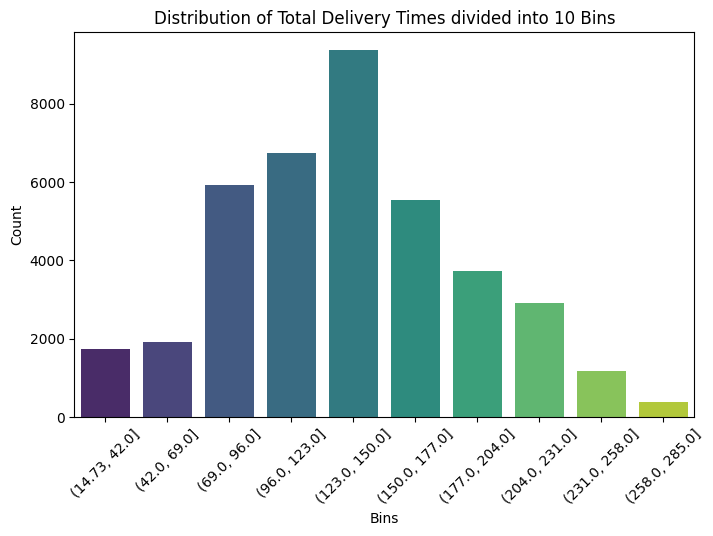

In [ ]:
# Create 10 bins using pandas.cut
df['Binned'] = pd.cut(df['Total_Time'], bins=10)

# Plot the data using seaborn
plt.figure(figsize=(8, 5))
sns.countplot(x='Binned', data=df, palette='viridis')

plt.title('Distribution of Total Delivery Times divided into 10 Bins')
plt.xlabel('Bins')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

The above graph makes sense: to have time ranges ~15min to 285min. We are now ready for EDA (Exploratory Data Analysis)

# EDA (Exploratory Data Analysis)

## Correlation Matrix

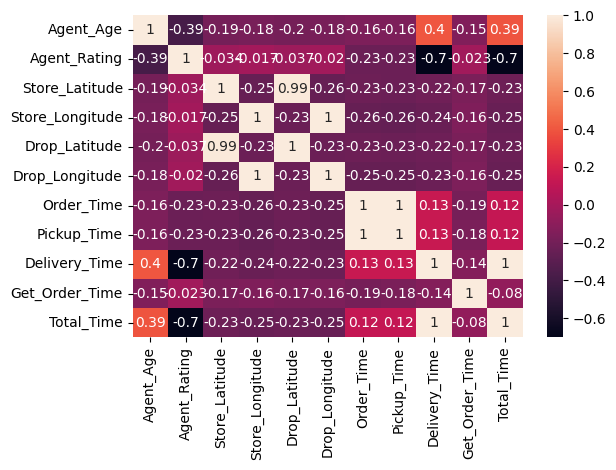

In [ ]:
df_numeric = df.select_dtypes(include=['number'])

# Compute correlation matrix
correlation_matrix = df_numeric.corr()

sns.heatmap(correlation_matrix.corr(),annot=True)
plt.tight_layout()
plt.show()

**Information about correlation:**
* **Weak Correlation** would be in the range of 0.1 to 0.3
* **Moderate**: from 0.3 to 0.5
* **Strong**: from 0.5 to 1.0

Based on the correlation matrix, here are some things to note:
1. **Strong Negative Correlation (-0.7) for Agent_Rating and Delivery_Time**. This means that with lower delivery time, agent rating tends to be higher (and vice versa).
2. **Moderate Positive Correlation for Delivery_Time and Agent_Age (0.4)** meaning that older the age of the driver, the likelihood for delivery time to be longer.
3. **Moderate Negative Correlation for Agent_Age and Agent_Rating (-0.39)** meaning that younger the driver, the higher the rating. This is likely due to lower delivery times from younger drivers



---



**Interesting Finding:**
It appears that faster (lower) delivery times leads to higher ratings.

It can be assumed that there are other factors than delivery times to consider agent_rating but due to the limitations of the dataset. ex. there is no data regarding delivery accuracy

However, we can solidify our findings that:
**lower the delivery time means higher customer satisfaction**

Therefore, this study will focus on finding methods to lower delivery times.

---



Other notes:
**Store and Drop Longitude and Latitude have perfect correlation.** This would make sense since this is "last mile" delivery but have no significance in our study







## Agent Rating Univariant Analysis and Purpose of this Study

<Axes: ylabel='Density'>

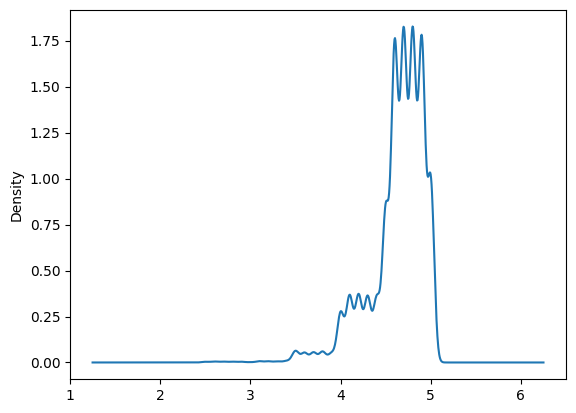

In [ ]:
df["Agent_Rating"].plot(kind="kde")

This is the plot of the Agent_Rating column. This is the area of focus since is the metric which would bring in higher customer satisfaction.

We have found that there is highest correlation with "Delivery Time" and "Rating".

**The objective of this study is to find ways to lower delivery time so that we can increase the ratings.**

## Which month of year has the most deliveries?

Though not directly related to Agent_Rating, here is an interesting finding

<Axes: xlabel='month', ylabel='count'>

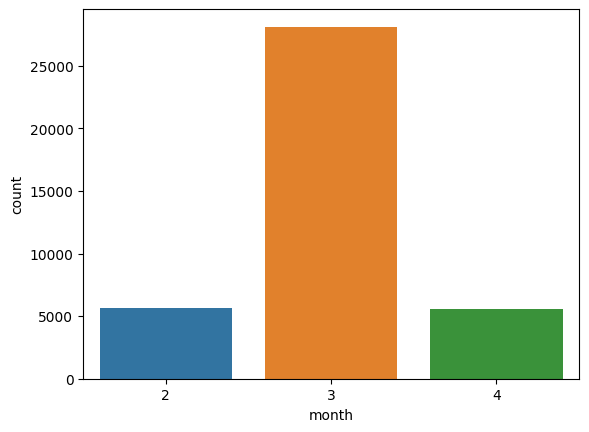

In [ ]:
df["month"]=df["Order_Date"].dt.month
sns.countplot(x=df["month"])

After grouping by the months, we find that March is the month with most sales. Is this so for a certain product category or all categories? Will find out in next code block

In [ ]:
month_sales = pd.pivot_table(df,index=["Category"],columns=["month"],values="Order_ID",aggfunc="count")
print(month_sales)

month           2     3    4
Category                    
Apparel       368  1753  333
Books         364  1805  360
Clothing      313  1740  335
Cosmetics     374  1685  331
Electronics   334  1856  372
Grocery       311  1763  341
Home          343  1756  347
Jewelry       358  1792  383
Kitchen       366  1671  362
Outdoors      376  1778  345
Pet Supplies  362  1732  342
Shoes         360  1700  346
Skincare      318  1828  359
Snacks        372  1767  322
Sports        370  1697  371
Toys          386  1791  356


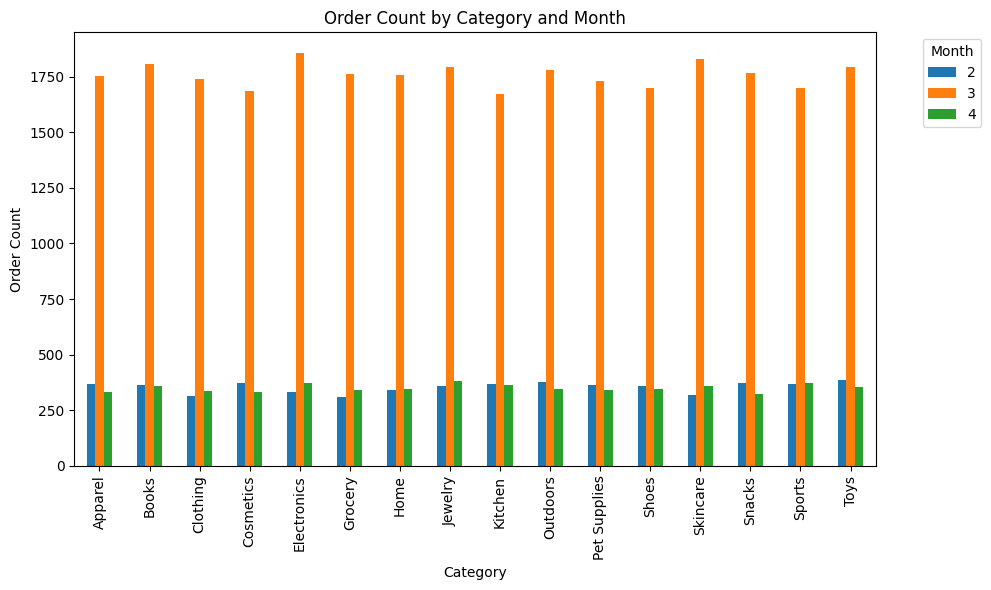

In [ ]:
# Plot the data as a bar graph
month_sales.plot(kind='bar', figsize=(10, 6))

# Customize the plot
plt.title('Order Count by Category and Month')
plt.xlabel('Category')
plt.ylabel('Order Count')
plt.legend(title='Month', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Show the plot
plt.show()

By grouping Category and Month of Sales, we were able to verify that **all categories of products deliver much higher numbers in the month of March**



## Agent Age

<Axes: xlabel='Agent_Age', ylabel='Agent_Rating'>

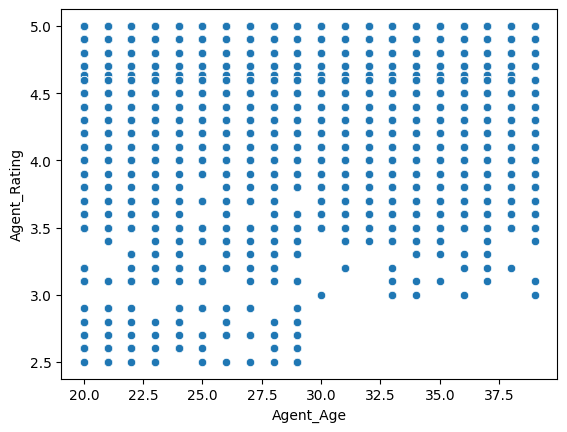

In [ ]:
sns.scatterplot(x=df["Agent_Age"],y=df["Agent_Rating"])

Since the output of the scatter plot is not in a "square box" like form, this is an interesting finding. Furhter code blocks digs deeper.

In [ ]:
# Group by 'Age' and calculate the mean of 'Delivery_Time'
result = df.groupby('Agent_Age', as_index=False)['Delivery_Time'].mean()

# Display the result
print(result)

    Agent_Age  Delivery_Time
0          20     108.892913
1          21     109.903427
2          22     108.996486
3          23     111.519515
4          24     109.124626
5          25     109.195797
6          26     110.313715
7          27     108.829457
8          28     111.390269
9          29     109.180899
10         30     138.729676
11         31     142.341053
12         32     144.324352
13         33     141.733401
14         34     140.118817
15         35     138.993201
16         36     141.069995
17         37     140.298851
18         38     140.385585
19         39     140.833845


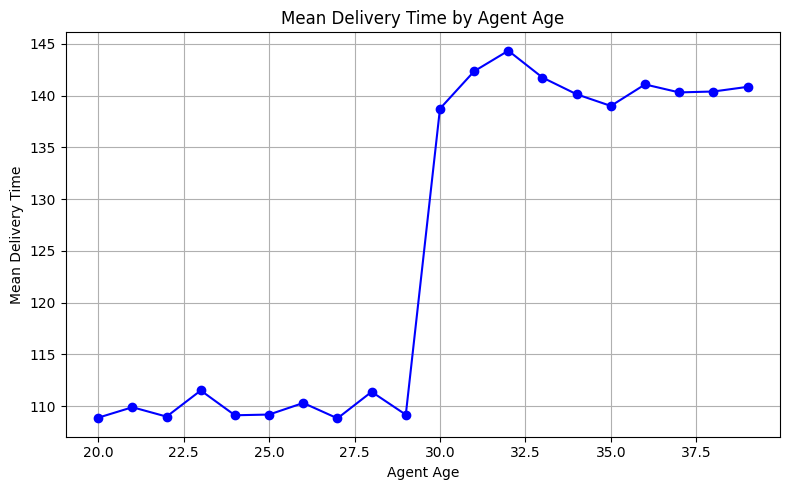

In [ ]:
# Plot the grouped data as a line graph
plt.figure(figsize=(8, 5))
plt.plot(result['Agent_Age'], result['Delivery_Time'], marker='o', linestyle='-', color='b')

# Customize the plot
plt.title('Mean Delivery Time by Agent Age')
plt.xlabel('Agent Age')
plt.ylabel('Mean Delivery Time')
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

What is a very interesting finding is that younger drivers tends to have significantly lower delivery times than that of older drivers (age >30). However, as stated before, we will need to see if age really does impact ratings.

In [ ]:
# Group by 'Age' and calculate the mean of 'Agent_Rating'
result = df.groupby('Agent_Age', as_index=False)['Agent_Rating'].mean()

# Display the result
print(result)

    Agent_Age  Agent_Rating
0          20      4.683378
1          21      4.681482
2          22      4.672290
3          23      4.687342
4          24      4.675108
5          25      4.673945
6          26      4.673815
7          27      4.675986
8          28      4.684289
9          29      4.670962
10         30      4.597075
11         31      4.584807
12         32      4.579072
13         33      4.593276
14         34      4.591756
15         35      4.594690
16         36      4.600050
17         37      4.602483
18         38      4.590777
19         39      4.579090


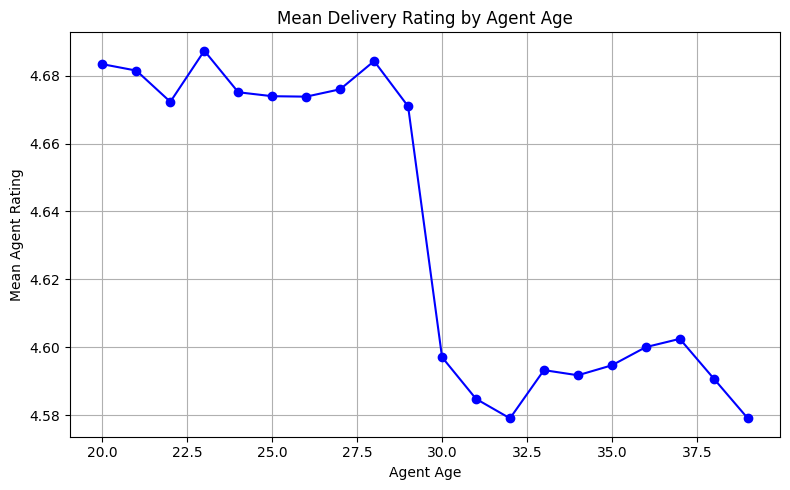

In [ ]:
# Plot the grouped data as a line graph
plt.figure(figsize=(8, 5))
plt.plot(result['Agent_Age'], result['Agent_Rating'], marker='o', linestyle='-', color='b')

# Customize the plot
plt.title('Mean Delivery Rating by Agent Age')
plt.xlabel('Agent Age')
plt.ylabel('Mean Agent Rating')
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

Conclusion:
*   Faster delivery times lead to higher Agent_Ratings
*   Younger drivers are faster at making shorter delivery times

Therefore, younger drivers deliver faster which lead to higher ratings



## Suggestions to Improve Delivery Time

### Category and Delivery Time

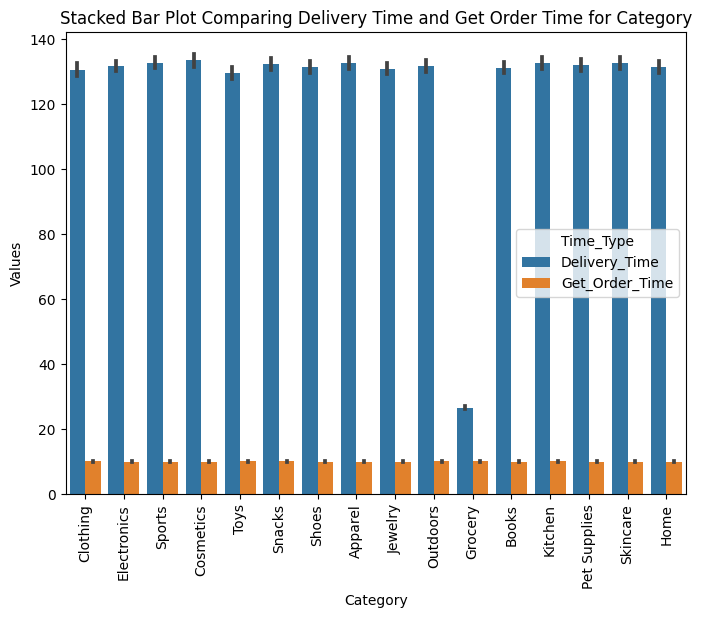

In [ ]:
# Reshape the DataFrame to long format
df_long = df.melt(id_vars="Category", value_vars=["Delivery_Time", "Get_Order_Time"],
                  var_name="Time_Type", value_name="Value")

# Create the stacked bar plot using Seaborn
plt.figure(figsize=(8, 6))
sns.barplot(x="Category", y="Value", hue="Time_Type", data=df_long)

# Rotate x-axis labels by 90 degrees
plt.xticks(rotation=90)

# Display the plot
plt.title('Stacked Bar Plot Comparing Delivery Time and Get Order Time for Category')
plt.xlabel('Category')
plt.ylabel('Values')
plt.show()

Observation:
*   Order time to Pickup at Store time: this is equal regardless of product category
*   Pickup at Store Time to Delivery Destination Time: All products are approximately equal except for groceries. **Groceries have the lower average delivery time from the store pickup to destionation**



### Interaction between Traffic Density, Vehicle Type, Delivery Time

In [ ]:
# Group by 'Traffic' and 'Vehicle', calculate the mean of 'Delivery_Time'
result = df.groupby(['Traffic', 'Vehicle'], as_index=False)['Delivery_Time'].mean()

# Get the count of occurrences of each combination of 'Traffic' and 'Vehicle'
count_result = df.groupby(['Traffic', 'Vehicle']).size().reset_index(name='Count')

# Merge the two results to include the count of occurrences
final_result = pd.merge(result, count_result, on=['Traffic', 'Vehicle'])

# Display the final result
print(final_result)

    Traffic      Vehicle  Delivery_Time  Count
0     High   motorcycle      137.325741   2327
1     High      scooter      118.031131   1317
2     High           van     119.300654    306
3      Jam   motorcycle      155.723693   7365
4      Jam      scooter      137.748183   4265
5      Jam           van     134.243427   1027
6      Low   motorcycle      105.422816   7670
7      Low      scooter       94.905577   4321
8      Low           van      94.601190   1008
9   Medium   motorcycle      132.888327   5731
10  Medium      scooter      118.326699   3266
11  Medium           van     119.877370    791


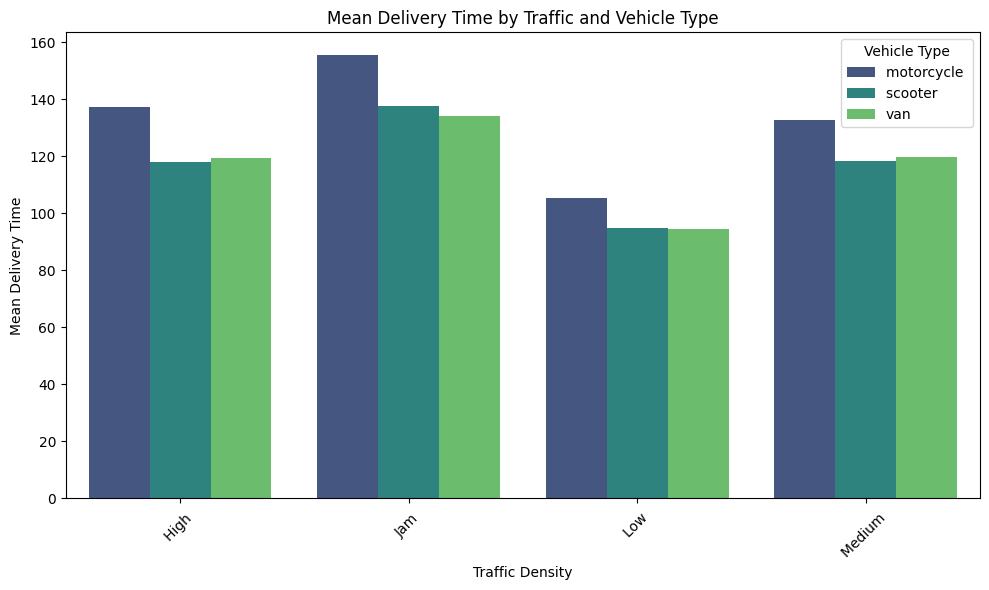

In [ ]:
# Plot using seaborn
plt.figure(figsize=(10, 6))
sns.barplot(data=result, x='Traffic', y='Delivery_Time', hue='Vehicle', palette='viridis')

# Customize the plot
plt.title('Mean Delivery Time by Traffic and Vehicle Type')
plt.ylabel('Mean Delivery Time')
plt.xlabel('Traffic Density')
plt.legend(title='Vehicle Type')
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

Observation:
*   Delivery Time: Jam > High > Medium > Low
*   **Motorcylces do have a higher delivery time** compared to other methods of transportation.
*   Hypothesis: perhaps finding difficulty locking the motorcylce to complete delivery?



<Axes: xlabel='Vehicle', ylabel='count'>

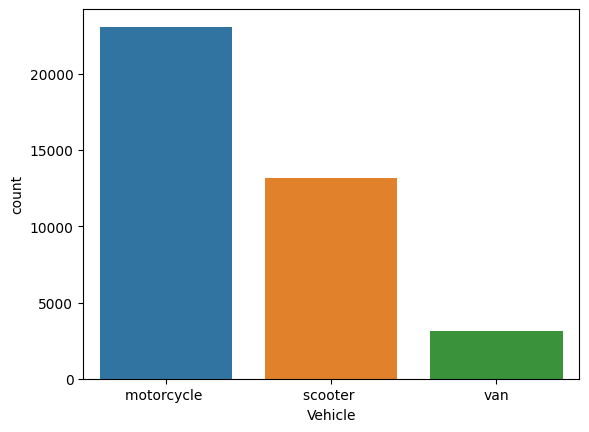

In [ ]:
sns.countplot(data=df,x=df["Vehicle"])

This is a significant finding since motorcycles are used by far the most in terms of method of transportation.

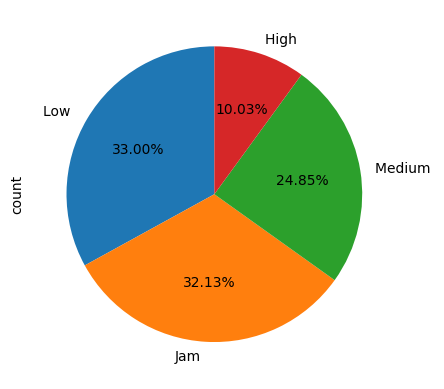

In [ ]:
df["Traffic"].value_counts().plot(kind='pie',autopct='%.2f%%',startangle=90)
plt.show()

It appears that 32.13% of traffic is classified as 'jam'. If we can find methods to lower jam, we can definately decrease delivery times.

### Does type of area impact delivery time?

<Axes: xlabel='Area', ylabel='Delivery_Time'>

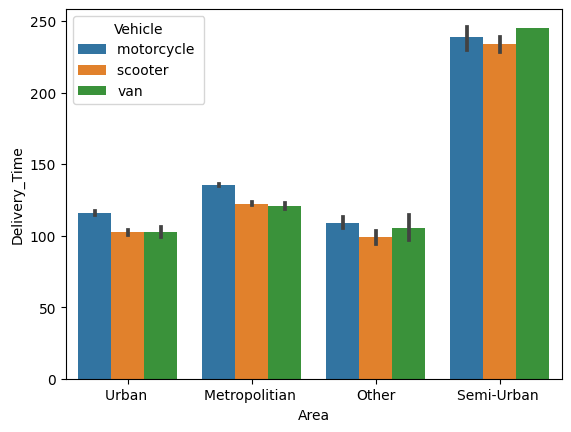

In [ ]:
sns.barplot(df,y=df["Delivery_Time"],x=df["Area"],hue=df["Vehicle"])

The part of the area where the delivery is held definately impacts delivery times. **Semi-Urban areas are the areas where the delivery time is negatively impacted.**

### Does Weather impact delivery time?

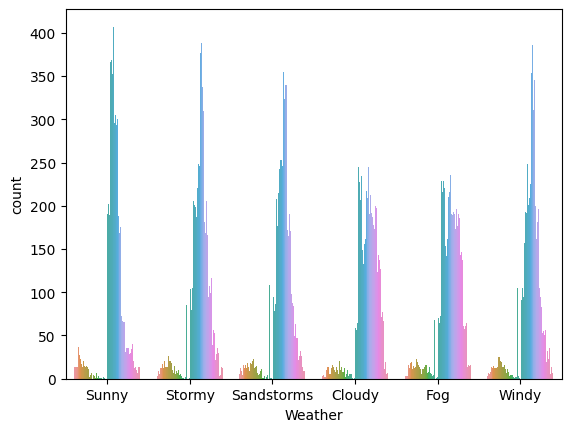

In [ ]:
sns.countplot(x=df["Weather"],hue=df["Delivery_Time"])
plt.legend([], [], frameon=False)  # Removes the legend

Weather does also seem to impact delivery times. It appears "bad" weather conditions (cloudy, fog) do cause faster delivery times. Likely because bad weather causes lower traffic.

# GIS (Geographic Information System)

In [ ]:
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster

In [ ]:
# Create a GeoDataFrame from the DataFrame
geometry = gpd.points_from_xy(df.Store_Longitude, df.Store_Latitude)
geo_df = gpd.GeoDataFrame(df[["Store_Latitude", "Store_Longitude"]], geometry=geometry)

# Get the average latitude and longitude to center the map
map_center = [geo_df.geometry.y.mean(), geo_df.geometry.x.mean()]

# Create a Folium map centered around the average latitude and longitude
m = folium.Map(location=map_center, zoom_start=5)

# Create a MarkerCluster to group markers
marker_cluster = MarkerCluster().add_to(m)

# Add markers to the cluster
for _, row in geo_df.iterrows():
    folium.Marker([row['Store_Latitude'], row['Store_Longitude']]).add_to(marker_cluster)

# Display the map
m

In [ ]:
from folium.plugins import HeatMap

# Combine store and drop locations for heatmap
locations = df[['Store_Latitude', 'Store_Longitude']].values.tolist() + df[['Drop_Latitude', 'Drop_Longitude']].values.tolist()

# Create a base map
m_heat = folium.Map(location=map_center, zoom_start=5)

# Add heatmap
HeatMap(locations).add_to(m_heat)

#Display Heatmap
m_heat

# Suggestions to improve Delivery Times (implications that this leads to better customer satisfaction [ex. agent_rating])

Lowering delivery times has a high correlation (0.7) in increasing agent_rating (customer satisfaction)

---

Suggestions to lower delivery times:
1. Younger drivers tend to deliver faster than older drivers
2. Time order received to order pick up at store is pretty much the same for all product category types. Focus on reducing delivery times from the store to final destination.
3.   Grocery delivery on average is the category with the fastest average delivery times
4. Motorcycles are the slowest method of transportation and they are the most used. Try emphasizing scooter or van instead.
5. Jam and High level of traffic significantly increase delivery times. Finding an alternate route with lower level of traffic might help since they are a quite significant occurence level of traffic encountered
6. Out of all areas, semi-urban is signficantly slower at delivery times. Other types of areas are signficantly lower.
7. "Bad Weather" seems to decrease delivery times. It's likely that there are lower levels of traffic during such weather conditions

---



